In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
inegi = pd.read_csv('inegi_old.csv')
inegi.shape

(177812, 11)

In [3]:
inegi.drop(columns=['www', 'nombre_act'], inplace=True)
inegi.head()

,nom_estab,per_ocu,entidad,municipio,localidad,tipoUniEco,latitud,longitud,fecha_alta
0,ANTOJITOS VICKY,0 a 5 personas,QUERÉTARO,San Juan del Río,San Juan del Río,Fijo,20.375935,-99.960659,2019-11-01
1,ANTOJITOS VICKY,0 a 5 personas,QUERÉTARO,Querétaro,Santiago de Querétaro,Fijo,20.604599,-100.407414,2014-12-01
2,ANTOJITOS VIKI,11 a 30 personas,QUERÉTARO,Huimilpan,El Vegil,Fijo,20.430326,-100.349455,2014-12-01
3,ANTOJITOS VIKY,0 a 5 personas,QUERÉTARO,Tequisquiapan,Tequisquiapan,Fijo,20.525991,-99.902751,2010-07-01
4,ANTOJITOS VUELVE A LA VIDA,0 a 5 personas,QUERÉTARO,Querétaro,Santiago de Querétaro,Fijo,20.634093,-100.459866,2019-11-01


# Extracting food types

In [4]:
import re

def clean_up(s):
    """
    Cleans up numbers, URLs, and special characters from a string.

    Args:
        s: The string to be cleaned up.

    Returns:
        A string that has been cleaned up.
    """
    res = re.sub('[0-9]+', '', s).lower()
    res = re.sub('http://\w+\.\w+', '', res)
    
    for letter in res:
        if not letter.isalpha() and letter != ' ':
            res = res.replace(letter,' ')
            
    #res = re.sub('http', '', res)
    return res.strip()

from nltk.tokenize import word_tokenize

def tokenize(s):
    """
    Tokenize a string.

    Args:
        s: String to be tokenized.

    Returns:
        A list of words as the result of tokenization.
    """
    return word_tokenize(s)\

from nltk.stem import SnowballStemmer
from nltk.stem import WordNetLemmatizer
#print(" ".join(SnowballStemmer.languages))

def stem_and_lemmatize(l):
    """
    Perform stemming and lemmatization on a list of words.

    Args:
        l: A list of strings.

    Returns:
        A list of strings after being stemmed and lemmatized.
    """
    stemmer = SnowballStemmer('spanish')
    lemmatizer = WordNetLemmatizer()
    
    res = []
    for word in l:
        stem_word = stemmer.stem(word) 
        res.append(lemmatizer.lemmatize(stem_word))
        
    return res

from nltk.corpus import stopwords

def remove_stopwords(l):
    """
    Remove English stopwords from a list of strings.

    Args:
        l: A list of strings.

    Returns:
        A list of strings after stop words are removed.
    """
    stopWords = set(stopwords.words('spanish'))
    return [w for w in l if w not in stopWords]

def prepareText(text):
    cleaned = clean_up(text)
    tokenized = tokenize(cleaned)
    sl_ized = stem_and_lemmatize(tokenized)
    return remove_stopwords(sl_ized)

In [5]:
import multiprocessing as mp

pool = mp.Pool(processes=(mp.cpu_count()-1))

inegi['nom_processed'] = pool.map(prepareText, inegi.nom_estab)

In [6]:
inegi['tipo'] = inegi.nom_processed.apply(lambda x: ' '.join(x))

pd.set_option('display.max_rows', None)
inegi.tipo.value_counts()

vent antojit nombr                                                                                       2446
antojit nombr                                                                                            2120
club nutricion herbalif                                                                                  1556
vent antojit                                                                                             1154
cocin econom nombr                                                                                       1086
taqueri nombr                                                                                            1076
club nutricion                                                                                            770
cocin econom                                                                                              747
antojit                                                                                                   603
cooper esc

In [7]:
inegi.head()

,nom_estab,per_ocu,entidad,municipio,localidad,tipoUniEco,latitud,longitud,fecha_alta,nom_processed,tipo
0,ANTOJITOS VICKY,0 a 5 personas,QUERÉTARO,San Juan del Río,San Juan del Río,Fijo,20.375935,-99.960659,2019-11-01,"[antojit, vicky]",antojit vicky
1,ANTOJITOS VICKY,0 a 5 personas,QUERÉTARO,Querétaro,Santiago de Querétaro,Fijo,20.604599,-100.407414,2014-12-01,"[antojit, vicky]",antojit vicky
2,ANTOJITOS VIKI,11 a 30 personas,QUERÉTARO,Huimilpan,El Vegil,Fijo,20.430326,-100.349455,2014-12-01,"[antojit, viki]",antojit viki
3,ANTOJITOS VIKY,0 a 5 personas,QUERÉTARO,Tequisquiapan,Tequisquiapan,Fijo,20.525991,-99.902751,2010-07-01,"[antojit, viky]",antojit viky
4,ANTOJITOS VUELVE A LA VIDA,0 a 5 personas,QUERÉTARO,Querétaro,Santiago de Querétaro,Fijo,20.634093,-100.459866,2019-11-01,"[antojit, vuelv, vid]",antojit vuelv vid


In [8]:
tipos = ['cocin', 'com', 'comedor', 'caser', 'antojit', 'lonch', 'cenadur', 'panuch', 'panucheri', 'salbut', 
         'cochinit', 'vaporcit', 'lechon', 'tamal', 'tamaleri', 'poll', 'polleri', 'desay', 'desayun', 'pizz', 
         'pizzeri', 'tort', 'torteri', 'burg','burgu', 'burger', 'hamburgues', 'taqueri', 'tac', 'carne', 'carnes', 
         'carner', 'asad', 'asader', 'carnit', 'mondong', 'mondongueri', 'menud', 'menuderi', 'memel', 'memelit', 
         'empan', 'empanadit', 'hot dog', 'hotdog', 'fritang', 'pesc', 'pescad', 'pescaderi', 'marisc', 'marisq', 
         'marisqueri', 'chicharr', 'chicharron', 'chicharroneri', 'gordit', 'cevich', 'cevicheri', 'costill', 
         'costilleri', 'grill', 'sushi', 'doradit', 'adoradit', 'baguet', 'baguets', 'baguett', 'baguetts', 
         'bagueteri', 'baguetteri', 'parrill', 'parrillit', 'parriller', 'parrillon' 'birri', 'birrieri', 'birria', 
         'pozol', 'pozoleri', 'pozolit', 'huarach', 'huaracheri', 'rosticeri', 'rostic', 'rostiz', 'china', 
         'chinesse', 'yuca', 'yucat', 'yucatec', 'tabas', 'tabasc', 'tabasqueñ', 'arracher', 'restaur', 'barbaco', 
         'pastor', 'enchil', 'chilaquil', 'chilaquileri']

def getTokenType(text):
    token_type = []
    for tipo in tipos:
        if tipo in text:
            token_type.append(tipo)
            
    return token_type
 
inegi.tipo = inegi.tipo.apply(getTokenType)

inegi.tipo.value_counts()

[]                                                                 59149
[antojit]                                                          17392
[taqueri]                                                          12148
[cocin]                                                             8656
[restaur]                                                           8304
[tac]                                                               7219
[gordit]                                                            4752
[lonch]                                                             4194
[com]                                                               3636
[tamal]                                                             3056
[tort]                                                              3004
[poll]                                                              2777
[poll, asad]                                                        2598
[marisc]                                           

In [9]:
tipos = ['cocin', 'com', 'comedor', 'caser', 'antojit', 'lonch', 'cenadur', 'panuch', 'panucheri', 'salbut', 
         'cochinit', 'vaporcit', 'lechon', 'tamal', 'tamaleri', 'poll', 'polleri', 'desay', 'desayun', 'pizz', 
         'pizzeri', 'tort', 'torteri', 'burg','burgu', 'burger', 'hamburgues', 'taqueri', 'tac', 'carne', 'carnes', 
         'carner', 'asad', 'asader', 'carnit', 'mondong', 'mondongueri', 'menud', 'menuderi', 'memel', 'memelit', 
         'empan', 'empanadit', 'hot dog', 'hotdog', 'fritang', 'pesc', 'pescad', 'pescaderi', 'marisc', 'marisq', 
         'marisqueri', 'chicharr', 'chicharron', 'chicharroneri', 'gordit', 'cevich', 'cevicheri', 'costill', 
         'costilleri', 'grill', 'sushi', 'doradit', 'adoradit', 'baguet', 'baguets', 'baguett', 'baguetts', 
         'bagueteri', 'baguetteri', 'parrill', 'parrillit', 'parriller', 'parrillon' 'birri', 'birrieri', 'birria', 
         'pozol', 'pozoleri', 'pozolit', 'huarach', 'huaracheri', 'rosticeri', 'rostic', 'rostiz', 'china', 
         'chinesse', 'yuca', 'yucat', 'yucatec', 'tabas', 'tabasc', 'tabasqueñ', 'arracher', 'restaur', 'barbaco', 
         'pastor', 'enchil', 'chilaquil', 'chilaquileri']

foods = {
    'Cocina Económica': ['cocin', 'com', 'caser', 'comedor'],
    'Antojitos': ['antojit', 'lonch', 'cenadur', 'fritang'],
    'Pizza': ['pizz', 'pizzeri'],
    'Hamburguesas': ['burg', 'burgu', 'burger', 'hamburgues'],
    'Hot Dogs': ['hot dog', 'hotdogs'],
    'Sushi': ['sush', 'sushi'],
    'Tamales': ['tamal', 'tamaleri', 'vaporcit'],
    'Mariscos': ['marisc', 'marisq', 'cevich', 'cevicheri', 'marisqueri'],
    'Pescado': ['pesc', 'pescad', 'pescaderi'],
    'Tacos': ['tac', 'taqu', 'taqueri'],
    'Carne': ['carne', 'carnes'],
    'Asada': ['asader', 'asad'],
    'Panuchos': ['panuch', 'panucheri', 'salbut'],
    'Cochinita': ['cochinit', 'lechon'],
    'Pollo': ['poll', 'polleri'],
    'Desayunos': ['desay', 'desayun'],
    'Tortas': ['tort', 'torteri'],
    'Mondongo': ['mondong', 'mondongueri'],
    'Menudo': ['menud', 'menuderi'],
    'Memelas': ['memelit', 'memel'],
    'Empanadas': ['empan', 'empanadit'],
    'Chicharrón': ['chicharr', 'chicharron', 'chicharroneri'],
    'Gorditas': ['gordit'],
    'Costillas': ['costill', 'costilleri'],
    'Carnitas': ['carnit'],
    'Doraditas': ['doradit', 'adoradit'],
    'Baguettes': ['deli', 'baguet', 'baguets', 'baguett', 'baguetts', 'bagueteri', 'baguetteri'],
    'Parrilla': ['parrill', 'parrillit', 'parriller', 'parrillon', 'grill'],
    'Huaraches': ['huarach', 'huaracheri'],
    'Rosticería': ['rost', 'rosti', 'rosticeri', 'rostic', 'rostiz'],
    'China': ['china', 'chinesse'],
    'Yucateca': ['yuca', 'yucat', 'yucatec'],
    'Tabasqueña': ['tabas', 'tabasc', 'tabasqueñ'],
    'Arrachera': ['arracher'],
    'Pastor': ['pastor'],
    'Birria': ['birri', 'birrieri', 'birria'],
    'Barbacoa': ['barbaco'],
    'Carnero': ['carner'],
    'Pozole': ['pozole', 'pozol', 'pozoleri', 'pozolit'],
    'Enchiladas': ['enchil'],
    'Chilaquiles': ['chilaquil', 'chilaquileri']
}

In [10]:
def checkType(l, foods):
    for item in l:
        if item in foods:
            return 1
    return 0

for food in foods:
    inegi[food] = inegi.tipo.apply(checkType, args=(foods[food],))
    
inegi.head()

,nom_estab,per_ocu,entidad,municipio,localidad,tipoUniEco,latitud,longitud,fecha_alta,nom_processed,...,Yucateca,Tabasqueña,Arrachera,Pastor,Birria,Barbacoa,Carnero,Pozole,Enchiladas,Chilaquiles
0,ANTOJITOS VICKY,0 a 5 personas,QUERÉTARO,San Juan del Río,San Juan del Río,Fijo,20.375935,-99.960659,2019-11-01,"[antojit, vicky]",...,0,0,0,0,0,0,0,0,0,0
1,ANTOJITOS VICKY,0 a 5 personas,QUERÉTARO,Querétaro,Santiago de Querétaro,Fijo,20.604599,-100.407414,2014-12-01,"[antojit, vicky]",...,0,0,0,0,0,0,0,0,0,0
2,ANTOJITOS VIKI,11 a 30 personas,QUERÉTARO,Huimilpan,El Vegil,Fijo,20.430326,-100.349455,2014-12-01,"[antojit, viki]",...,0,0,0,0,0,0,0,0,0,0
3,ANTOJITOS VIKY,0 a 5 personas,QUERÉTARO,Tequisquiapan,Tequisquiapan,Fijo,20.525991,-99.902751,2010-07-01,"[antojit, viky]",...,0,0,0,0,0,0,0,0,0,0
4,ANTOJITOS VUELVE A LA VIDA,0 a 5 personas,QUERÉTARO,Querétaro,Santiago de Querétaro,Fijo,20.634093,-100.459866,2019-11-01,"[antojit, vuelv, vid]",...,0,0,0,0,0,0,0,0,0,0


In [11]:
inegi_results = {}

for food in foods:
    inegi_results[food] = inegi[food].sum()
    
inegi_results

{'Cocina Económica': 17404,
 'Antojitos': 25752,
 'Pizza': 4058,
 'Hamburguesas': 3809,
 'Hot Dogs': 1785,
 'Sushi': 1057,
 'Tamales': 3444,
 'Mariscos': 3923,
 'Pescado': 988,
 'Tacos': 24023,
 'Carne': 21,
 'Asada': 4678,
 'Panuchos': 818,
 'Cochinita': 494,
 'Pollo': 7249,
 'Desayunos': 979,
 'Tortas': 5627,
 'Mondongo': 55,
 'Menudo': 555,
 'Memelas': 278,
 'Empanadas': 470,
 'Chicharrón': 571,
 'Gorditas': 5546,
 'Costillas': 220,
 'Carnitas': 2589,
 'Doraditas': 41,
 'Baguettes': 59,
 'Parrilla': 650,
 'Huaraches': 115,
 'Rosticería': 1671,
 'China': 88,
 'Yucateca': 183,
 'Tabasqueña': 182,
 'Arrachera': 30,
 'Pastor': 337,
 'Birria': 752,
 'Barbacoa': 788,
 'Carnero': 19,
 'Pozole': 1426,
 'Enchiladas': 559,
 'Chilaquiles': 34}

In [12]:
pd.set_option('display.max_rows', 20)

# Generating working CSV (inegi.csv)

In [13]:
inegi.to_csv('inegi.csv', index=False)

# Overview

In [14]:
inegi.head()

,nom_estab,per_ocu,entidad,municipio,localidad,tipoUniEco,latitud,longitud,fecha_alta,nom_processed,...,Yucateca,Tabasqueña,Arrachera,Pastor,Birria,Barbacoa,Carnero,Pozole,Enchiladas,Chilaquiles
0,ANTOJITOS VICKY,0 a 5 personas,QUERÉTARO,San Juan del Río,San Juan del Río,Fijo,20.375935,-99.960659,2019-11-01,"[antojit, vicky]",...,0,0,0,0,0,0,0,0,0,0
1,ANTOJITOS VICKY,0 a 5 personas,QUERÉTARO,Querétaro,Santiago de Querétaro,Fijo,20.604599,-100.407414,2014-12-01,"[antojit, vicky]",...,0,0,0,0,0,0,0,0,0,0
2,ANTOJITOS VIKI,11 a 30 personas,QUERÉTARO,Huimilpan,El Vegil,Fijo,20.430326,-100.349455,2014-12-01,"[antojit, viki]",...,0,0,0,0,0,0,0,0,0,0
3,ANTOJITOS VIKY,0 a 5 personas,QUERÉTARO,Tequisquiapan,Tequisquiapan,Fijo,20.525991,-99.902751,2010-07-01,"[antojit, viky]",...,0,0,0,0,0,0,0,0,0,0
4,ANTOJITOS VUELVE A LA VIDA,0 a 5 personas,QUERÉTARO,Querétaro,Santiago de Querétaro,Fijo,20.634093,-100.459866,2019-11-01,"[antojit, vuelv, vid]",...,0,0,0,0,0,0,0,0,0,0


In [15]:
inegi.groupby('entidad').sum()

,latitud,longitud,Cocina Económica,Antojitos,Pizza,Hamburguesas,Hot Dogs,Sushi,Tamales,Mariscos,...,Yucateca,Tabasqueña,Arrachera,Pastor,Birria,Barbacoa,Carnero,Pozole,Enchiladas,Chilaquiles
entidad,,,,,,,,,,,,,,,,,,,,,
QUERÉTARO,256362.395166,-1.247941e+06,1252,481,363,281,21,55,181,211,...,5,0,4,22,5,254,1,28,68,11
QUINTANA ROO,230743.415797,-9.836779e+05,742,1942,330,176,42,41,68,102,...,58,20,4,16,0,54,1,33,2,4
SAN LUIS POTOSÍ,346848.267964,-1.570775e+06,1943,1371,285,341,39,23,248,367,...,2,1,7,21,7,59,1,23,370,2
SINALOA,378341.405885,-1.648376e+06,1103,1224,409,399,342,520,428,1103,...,1,4,0,24,354,7,0,17,4,3
SONORA,385655.950767,-1.464917e+06,724,441,408,309,747,275,351,671,...,1,4,0,31,172,25,1,0,0,2
TABASCO,215346.517400,-1.111499e+06,736,2527,157,182,55,13,148,76,...,15,115,1,25,0,47,0,1185,3,0
TAMAULIPAS,381854.844838,-1.532007e+06,1135,852,184,440,96,30,319,350,...,9,1,3,35,0,128,1,6,19,4
TLAXCALA,159708.381792,-8.117340e+05,951,685,216,117,11,9,137,129,...,0,4,1,10,1,89,1,15,8,2
VERACRUZ DE IGNACIO DE LA LLAVE,931640.051320,-4.673045e+06,5706,11846,816,968,331,32,1018,594,...,6,15,4,88,18,93,3,43,76,5


In [16]:
inegi.fecha_alta.value_counts()

2019-11-01    95936
2010-07-01    47493
2014-12-01    32157
2016-01-01      588
2016-10-01      363
2013-07-01      293
2017-11-01      269
2019-04-01      196
2012-06-01      178
2011-03-01      162
2017-03-01      118
2018-11-01       36
2018-03-01       23
Name: fecha_alta, dtype: int64

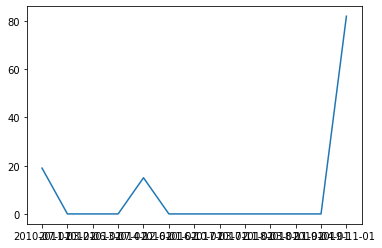

In [17]:
plt.plot(inegi[inegi.entidad=='YUCATAN'].groupby('fecha_alta').sum().index, inegi[inegi.entidad=='YUCATAN'].groupby('fecha_alta').sum()['Mariscos'])

In [18]:
inegi[inegi.entidad=='YUCATAN'].groupby('fecha_alta').sum()

,latitud,longitud,Cocina Económica,Antojitos,Pizza,Hamburguesas,Hot Dogs,Sushi,Tamales,Mariscos,...,Yucateca,Tabasqueña,Arrachera,Pastor,Birria,Barbacoa,Carnero,Pozole,Enchiladas,Chilaquiles
fecha_alta,,,,,,,,,,,,,,,,,,,,,
2010-07-01,96234.093322,-411796.480853,583,965,186,47,9,2,97,19,...,25,7,1,17,0,4,2,24,0,0
2011-03-01,314.782633,-1344.164845,0,2,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2012-06-01,251.984488,-1075.428842,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2013-07-01,416.989670,-1791.720308,1,5,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2014-12-01,65714.437717,-281349.280495,542,707,133,35,15,10,84,15,...,9,3,1,4,0,2,2,12,3,0
2016-01-01,1008.799729,-4296.337790,0,0,0,1,0,2,0,0,...,1,0,0,0,0,0,0,0,0,0
2016-10-01,629.032870,-2685.784668,2,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2017-03-01,189.076861,-806.526343,0,0,1,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2017-11-01,755.181401,-3223.164138,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## fecha_alta does not gives real info about when the business starts, so we don't use it